# PaCMAP Benchmark

```{contents}
```

## Load data

In [1]:
import pandas as pd
from source.pacmap_functions import *

input_path = '../Data/Intermediate_Files/'
output_path = '../Data/Processed_Data/'

# read df_discovery and df_validation
df_discovery = pd.read_pickle(
    input_path+'df_discovery.pkl').sort_index()

df_validation = pd.read_pickle(
    input_path+'df_validation.pkl').sort_index()

# Load clinical data
discovery_clinical_data = pd.read_csv(input_path+'discovery_clinical_data.csv',
                                      low_memory=False, index_col=0)

# Load clinical data
validation_clinical_data = pd.read_csv(input_path+'validation_clinical_data.csv',
                                        low_memory=False, index_col=0)

# Adjust clinical data
discovery_clinical_data['Train Test'] = 'Discovery (train) Samples'
validation_clinical_data['Train Test'] = 'Validation (test) Samples'

discovery_clinical_data['PaCMAP Output'] = 'Patient Samples'
validation_clinical_data['PaCMAP Output'] = 'Patient Samples'

discovery_clinical_data['Batch'] = df_discovery['Batch']
validation_clinical_data['Batch'] = 'St Jude Children\'s'

# use overlapping features between df_discovery and df_validation
common_features = [x for x in df_discovery.columns if x in df_validation.columns]

# apply `common_features` to both df_discovery and df_validation
df_discovery = df_discovery[common_features]
df_validation = df_validation[common_features]

print(
f' Discovery dataset (df_discovery) contains {df_discovery.shape[1]} \
columns (5mC nucleotides/probes) and {df_discovery.shape[0]} rows (samples).')

print(
f' Validation dataset (df_validation) contains {df_validation.shape[1]} \
columns (5mC nucleotides/probes) and {df_validation.shape[0]} rows (samples).')

output_notebook()

# Set the theme for the plot
curdoc().theme = 'light_minimal' # or 'dark_minimal'

 Discovery dataset (df_discovery) contains 319738 columns (5mC nucleotides/probes) and 3330 rows (samples).
 Validation dataset (df_validation) contains 319738 columns (5mC nucleotides/probes) and 201 rows (samples).


Loading BokehJS ...

## All samples

In [2]:
clinical_trials = ['NOPHO ALL92-2000', 
                    'AAML0531',
                    'AAML1031',
                    'Beat AML Consortium',
                    'TCGA AML',
                    'CETLAM SMD-09 (MDS-tAML)',
                    'French GRAALL 2003–2005',
                    'TARGET ALL',
                    'AAML03P1',
                    'Japanese AML05',
                    'CCG2961']

sample_types = ['Diagnosis', 'Primary Blood Derived Cancer - Bone Marrow',
                'Bone Marrow Normal','Primary Blood Derived Cancer - Peripheral Blood',
                'Blood Derived Normal','Likely Diagnosis', 'Control (Healthy Donor)',
                'Relapse','Recurrent Blood Derived Cancer - Bone Marrow',
                'Recurrent Blood Derived Cancer - Peripheral Blood',
                'Peripheral Blood Normal']

cols = ['Clinical Trial', 'Sample Type', 'Patient_ID', 'ELN AML 2022 Diagnosis', 'Train Test', 'Batch']

components = [2,5]
for n in components:
    processor = DataProcessor(discovery_clinical_data.copy(),
                              df_discovery,
                              clinical_trials,
                              sample_types,
                              cols, 
                              n_components=n,
                              common_prefix=output_path+f'pacmap_output/pacmap_{n}d_model_acute_leukemia', 
                              df_test=df_validation.copy(),
                              test_clinical_data=validation_clinical_data.copy())
    
    processor.filter_data()
    processor.apply_pacmap() # learn PaCMAP on the training data
    processor.apply_pacmap_test() # apply PaCMAP to the test data
    processor.join_labels()

    # Save output
    processor.df.to_csv(output_path+f'pacmap_output/pacmap_{n}d_output_acute_leukemia.csv')


df = pd.read_csv(output_path+'pacmap_output/pacmap_2d_output_acute_leukemia.csv', index_col=0)

In [3]:
# Concatenate discovery and validation clinical data
clinical_data = pd.concat([discovery_clinical_data, validation_clinical_data]).loc[df['index']]

# Select columns to plot
cols = ['PaCMAP Output','Hematopoietic Lineage','WHO 2021 Diagnosis','WHO AML 2021 Diagnosis',
        'WHO ALL 2021 Diagnosis','ELN AML 2022 Diagnosis','Age (group years)', 'Batch', 'Sex',
        'Clinical Trial', 'Sample Type', 'Train Test']

# Join clinical data to the embedding
df = df.join(clinical_data[cols], rsuffix='_copy', on='index')

# Call the BokehPlotter class to plot the data
plotter = BokehPlotter(df, cols, get_custom_color_palette(), 
                       title='The Methylome Atlas of Acute Leukemia',
                       x_range=(-50, 50), y_range=(-50, 50),
                       datapoint_size=3)
plotter.plot()

## Benchmark Classifiers

### Prepare data

In [16]:
df = pd.read_csv(output_path+'pacmap_output/pacmap_2d_model_peds_dx_aml.csv', index_col=0)
# exclude the samples with mixed phenotypes and Down syndrome and t(9;22)(q34.1;q11.2)/BCR::ABL1
df3 = df[~df['ELN AML 2022 Diagnosis'].isin(['Mixed phenotype acute leukemia T/myeloid',
                                       'Myeloid leukaemia associated with Down syndrome',
                                       'AML with t(9;22)(q34.1;q11.2)/BCR::ABL1'])]

# drop the samples with missing labels for the ELN AML 2022 Diagnosis
df3 = df3[~df3['ELN AML 2022 Diagnosis'].isna()]

# Define X and y
X = df3[['PaCMAP 1', 'PaCMAP 2']].to_numpy() # shape (n_samples=1399, n_features=2)
y = df3['ELN AML 2022 Diagnosis'].to_numpy() # shape (n_samples=1399,) with 11 string classes

# Split the data into train/test sets based on the `Train Test` column
X_train = X[df3['Train Test']=='Discovery (train) Samples']
y_train = y[df3['Train Test']=='Discovery (train) Samples']
X_test = X[df3['Train Test']=='Validation (test) Samples']
y_test = y[df3['Train Test']=='Validation (test) Samples']

from sklearn.gaussian_process import GaussianProcessClassifier

# Fit/predict
gpc = GaussianProcessClassifier(multi_class='one_vs_rest', random_state=42, n_jobs=-1)
_ = gpc.fit(X_train, y_train)
y_pred = gpc.predict(X_test)
y_pred_proba = gpc.predict_proba(X_test)

# Evaluate
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, roc_auc_score

print(f'Accuracy score: {accuracy_score(y_test, y_pred):.3f}')
print(f'Balanced accuracy score: {balanced_accuracy_score(y_test, y_pred):.3f}')
print(f'F1 score: {f1_score(y_test, y_pred, average="weighted"):.3f}')
# print(f'ROC AUC score: {roc_auc_score(y_test, y_pred_proba, multi_class="ovr", average="weighted"):.3f}')


Accuracy score: 0.825
Balanced accuracy score: 0.760
F1 score: 0.841


In [9]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
import numpy as np

# Initialize Gaussian Process Classifier
gpc = GaussianProcessClassifier(multi_class='one_vs_rest', random_state=42, n_jobs=-1)

# Define cross-validation strategy
cv = StratifiedKFold(n_splits=10, random_state=42, shuffle=True)

# Store predictions and probabilities
y_pred = np.empty_like(y, dtype=y.dtype)  # this will hold the predictions
y_pred_proba = np.zeros((len(y), len(np.unique(y))))  # this will hold the probabilities

# Perform cross-validation
for train_index, test_index in cv.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    gpc.fit(X_train, y_train)
    y_pred[test_index] = gpc.predict(X_test)
    y_pred_proba[test_index] = gpc.predict_proba(X_test)

# Show average accuracy score
accuracy = accuracy_score(y, y_pred)
print(f"Cross-validated Accuracy: {accuracy}")


Cross-validated Accuracy: 0.7962830593280915


## PaCMAP 10d

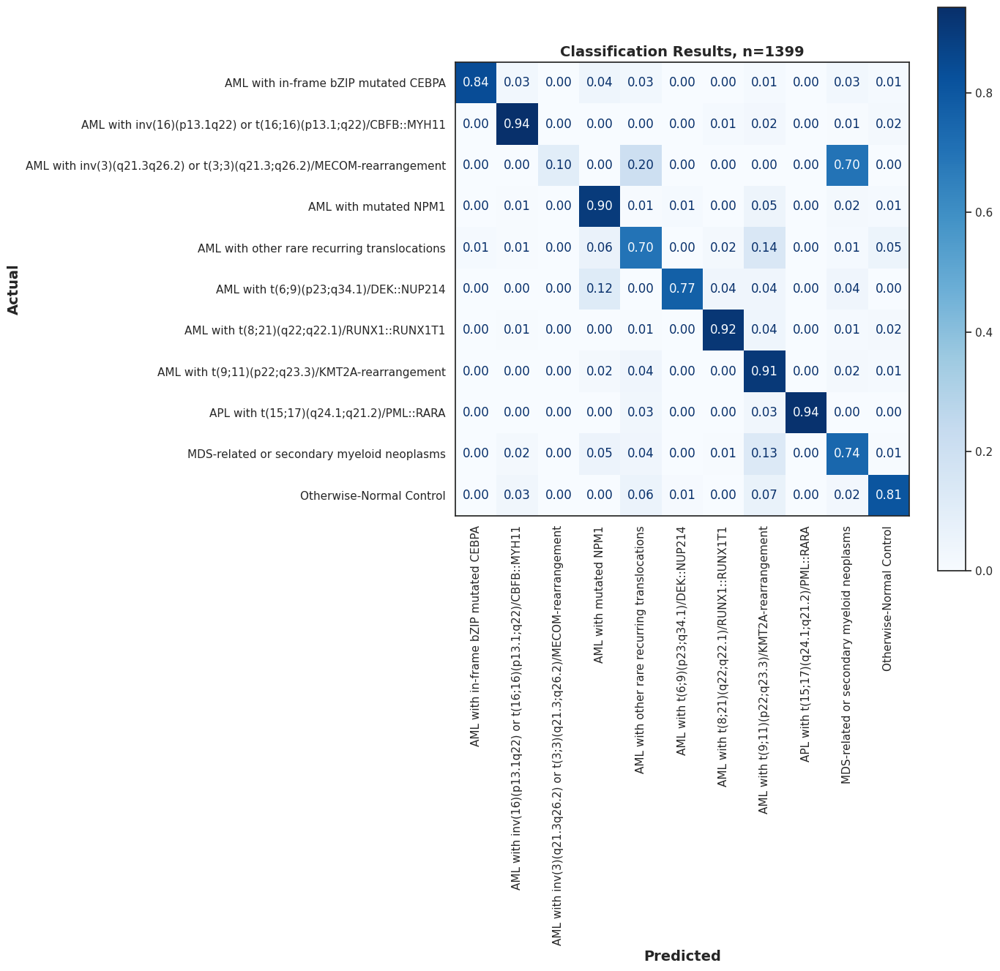

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(clf, x_test, y_test):
    sns.set_theme(style='white')
    predictions = clf.predict(x_test)
    cm = confusion_matrix(y_test, predictions, labels=clf.classes_, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                  display_labels=clf.classes_)
    disp.plot(cmap='Blues', values_format='.2f', xticks_rotation='vertical')

    # Increase the size of the plot
    fig = plt.gcf()
    fig.set_size_inches(10, 10)

    # Add title and axis names
    plt.title('Classification Results, n=' + str(len(x_test)), fontsize=14, fontweight='bold')
    plt.xlabel('Predicted', fontsize=14, fontweight='bold')
    plt.ylabel('Actual', fontsize=14, fontweight='bold')

    plt.show()

plot_confusion_matrix(gpc, X, y)

## PaCMAP 5d

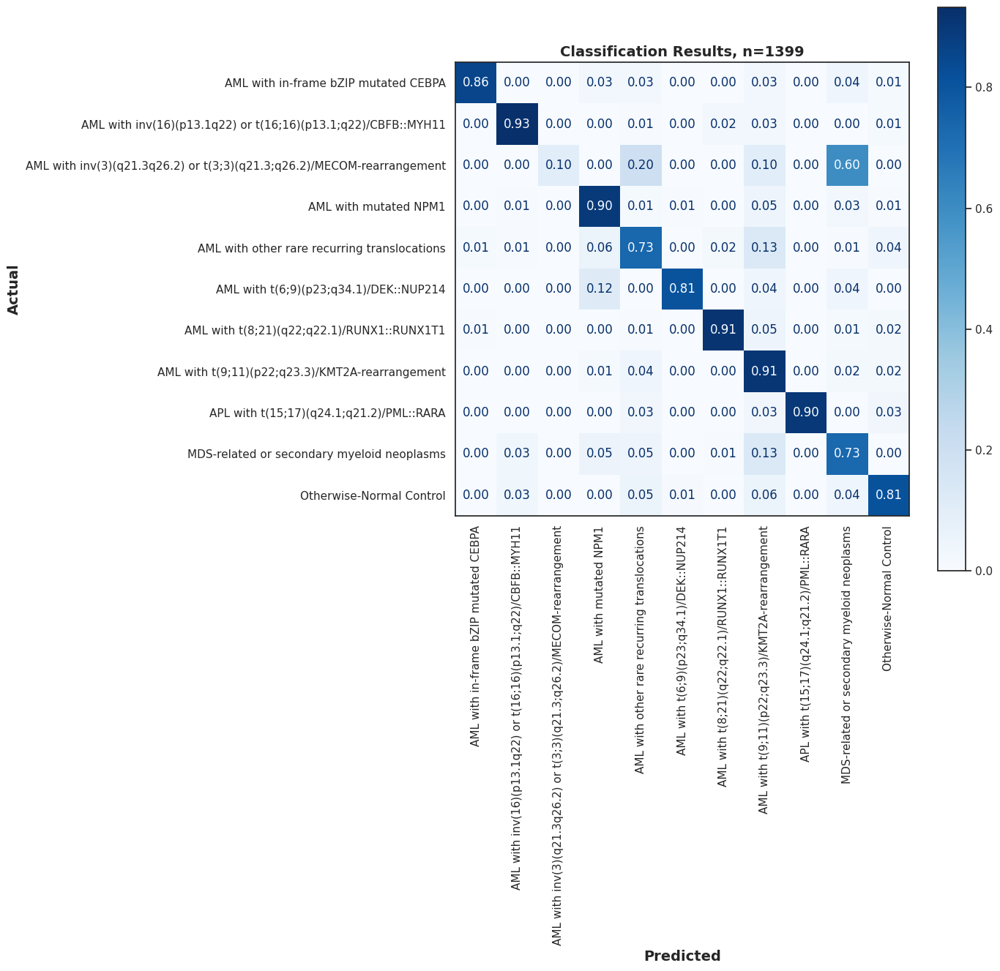

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(clf, x_test, y_test):
    sns.set_theme(style='white')
    predictions = clf.predict(x_test)
    cm = confusion_matrix(y_test, predictions, labels=clf.classes_, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                  display_labels=clf.classes_)
    disp.plot(cmap='Blues', values_format='.2f', xticks_rotation='vertical')

    # Increase the size of the plot
    fig = plt.gcf()
    fig.set_size_inches(10, 10)

    # Add title and axis names
    plt.title('Classification Results, n=' + str(len(x_test)), fontsize=14, fontweight='bold')
    plt.xlabel('Predicted', fontsize=14, fontweight='bold')
    plt.ylabel('Actual', fontsize=14, fontweight='bold')

    plt.show()

plot_confusion_matrix(gpc, X, y)

## PaCMAP 3d

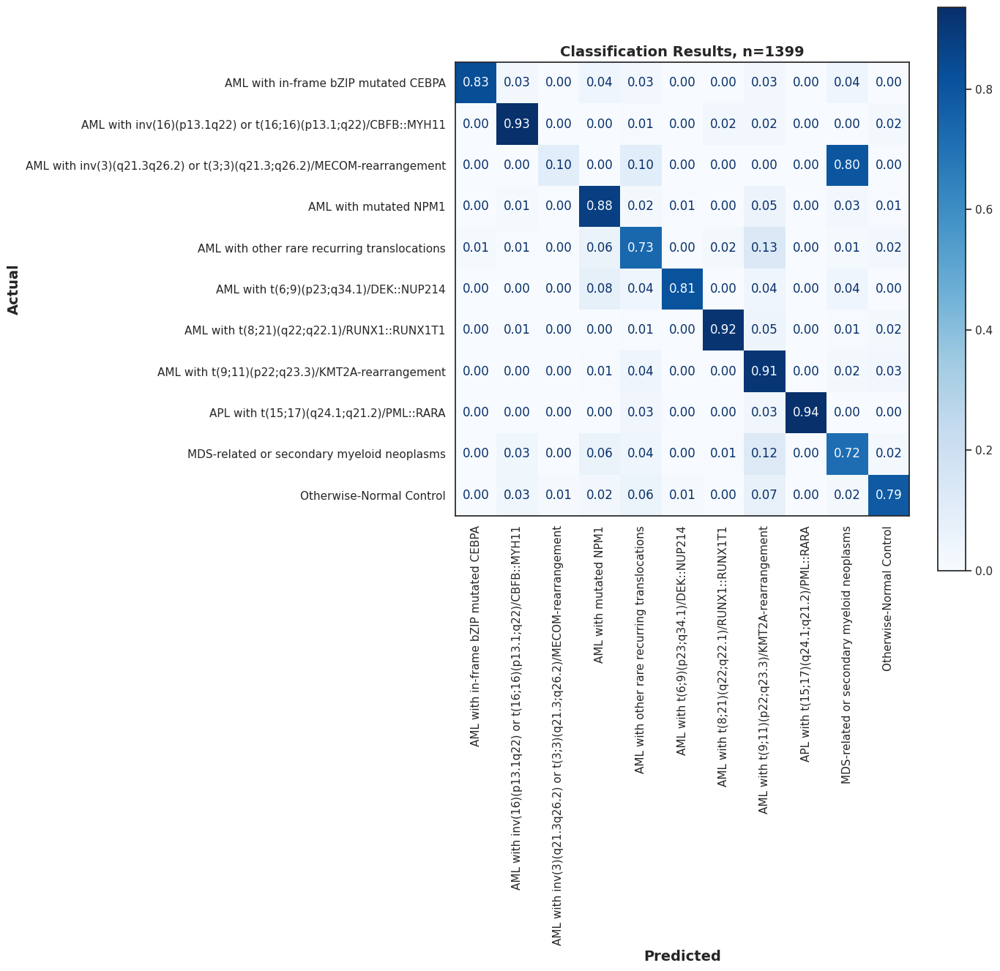

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(clf, x_test, y_test):
    sns.set_theme(style='white')
    predictions = clf.predict(x_test)
    cm = confusion_matrix(y_test, predictions, labels=clf.classes_, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                  display_labels=clf.classes_)
    disp.plot(cmap='Blues', values_format='.2f', xticks_rotation='vertical')

    # Increase the size of the plot
    fig = plt.gcf()
    fig.set_size_inches(10, 10)

    # Add title and axis names
    plt.title('Classification Results, n=' + str(len(x_test)), fontsize=14, fontweight='bold')
    plt.xlabel('Predicted', fontsize=14, fontweight='bold')
    plt.ylabel('Actual', fontsize=14, fontweight='bold')

    plt.show()

plot_confusion_matrix(gpc, X, y)

## PaCMAP 2d

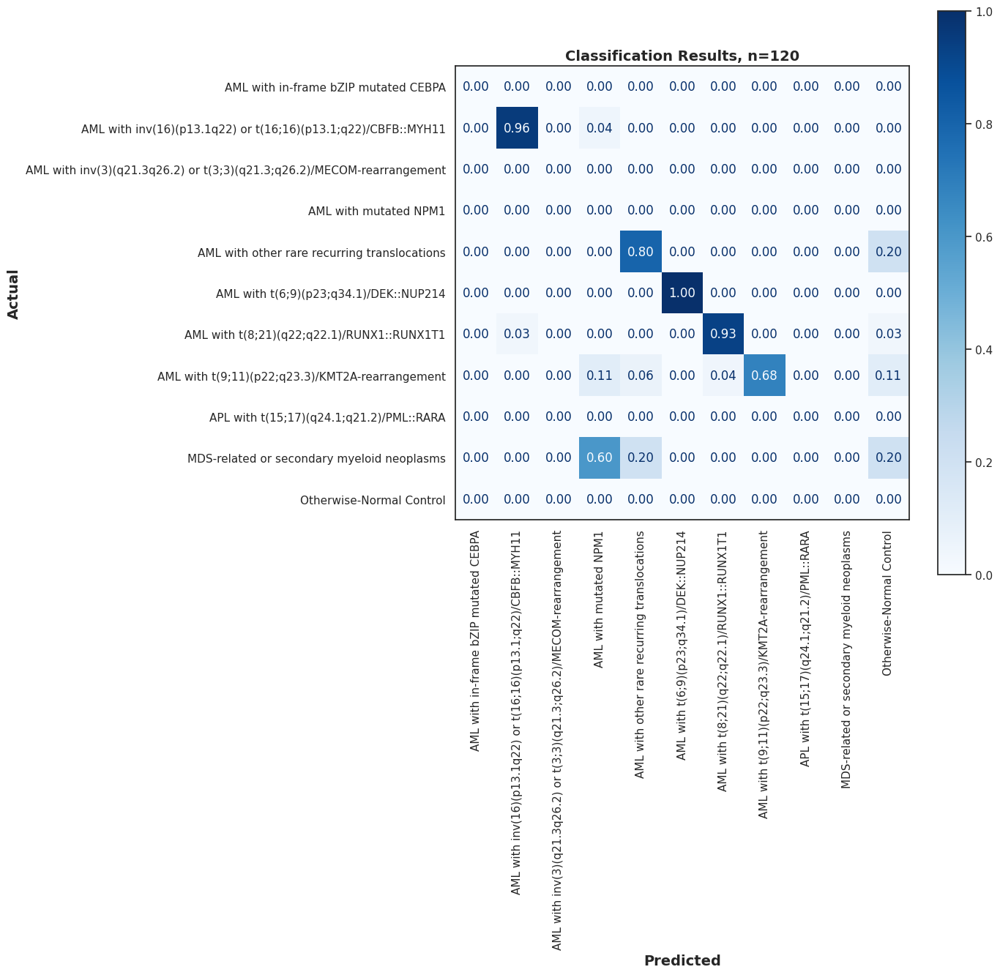

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(clf, x_test, y_test):
    sns.set_theme(style='white')
    predictions = clf.predict(x_test)
    cm = confusion_matrix(y_test, predictions, labels=clf.classes_, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                  display_labels=clf.classes_)
    disp.plot(cmap='Blues', values_format='.2f', xticks_rotation='vertical')

    # Increase the size of the plot
    fig = plt.gcf()
    fig.set_size_inches(10, 10)

    # Add title and axis names
    plt.title('Classification Results, n=' + str(len(x_test)), fontsize=14, fontweight='bold')
    plt.xlabel('Predicted', fontsize=14, fontweight='bold')
    plt.ylabel('Actual', fontsize=14, fontweight='bold')

    plt.show()

plot_confusion_matrix(gpc, X_test, y_test)

## ROC curves

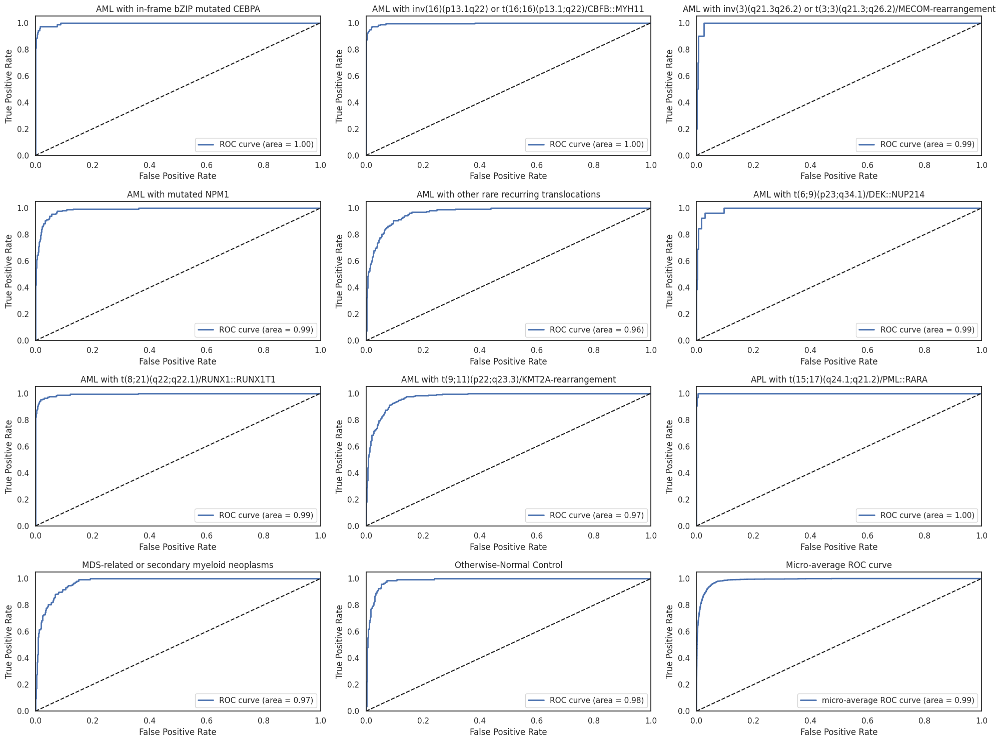

In [14]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
import numpy as np

# Binarize the output
lb = LabelBinarizer()
y_bin = lb.fit_transform(df3['ELN AML 2022 Diagnosis'])
y_bin = np.array(y_bin)  # Ensure y_bin is a numpy array
n_classes = y_bin.shape[1]

# Convert y_pred_proba to numpy array
y_pred_proba = np.array(y_pred_proba)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), y_pred_proba.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot all ROC curves
plt.figure(figsize=(20,15))
for i in range(n_classes):
    plt.subplot(4, 3, i+1)
    plt.plot(fpr[i], tpr[i], color='b', lw=2, label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('%s' % lb.classes_[i])  # Show class names
    plt.legend(loc="lower right")

# Plot micro-average ROC curve on the 12th panel
plt.subplot(4, 3, 12)
plt.plot(fpr["micro"], tpr["micro"], color='b', lw=2, label='micro-average ROC curve (area = %0.2f)' % roc_auc["micro"])
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-average ROC curve')  # Title for micro-average
plt.legend(loc="lower right")

plt.tight_layout()  # Adjust spaces between the plots
plt.show()


## Supplemental 1. Pediatric diagnostic AML samples

In [6]:
clinical_trials = ['AAML0531', 'AAML1031', 'AAML03P1', 'CCG2961', 'Japanese AML05']

sample_types = ['Diagnosis', 'Primary Blood Derived Cancer - Bone Marrow', 'Bone Marrow Normal',
                'Primary Blood Derived Cancer - Peripheral Blood', 'Blood Derived Normal']

cols = ['Clinical Trial', 'Sample Type', 'Patient_ID', 'ELN AML 2022 Diagnosis', 'Train Test', 'Batch']

components = [2,5]
for n in components:
    processor = DataProcessor(discovery_clinical_data.copy(),
                              df_discovery,
                              clinical_trials,
                              sample_types,
                              cols, 
                              n_components=n,
                              common_prefix=output_path+f'pacmap_output/pacmap_{n}d_model_peds_dx_aml', 
                              df_test=df_validation.copy(),
                              test_clinical_data=validation_clinical_data.copy())
    
    processor.filter_data()
    processor.apply_pacmap() # learn PaCMAP on the training data
    processor.apply_pacmap_test() # apply PaCMAP to the test data
    processor.join_labels() # join clinical data to the embedding

    # Save output
    processor.df.to_csv(output_path+f'pacmap_output/pacmap_{n}d_model_peds_dx_aml.csv')

In [7]:
df2 = pd.read_csv(output_path+'pacmap_output/pacmap_2d_model_peds_dx_aml.csv', index_col=0)

# Select columns to plot
cols = ['PaCMAP Output','Hematopoietic Lineage','WHO AML 2021 Diagnosis','ELN AML 2022 Diagnosis', 'FAB', 'FLT3 ITD', 'Age (group years)',
        'Complex Karyotype', 'Primary Cytogenetic Code' ,'Batch', 'Sex', 'MRD 1 Status',
        'Leucocyte counts (10⁹/L)', 'Risk Group', 'Race or ethnic group',
        'Clinical Trial', 'Vital Status','First Event','Sample Type', 'Train Test']

# Join clinical data to the embedding
df2 = df2.join(clinical_data[cols], rsuffix='_copy', on='index')

plotter = BokehPlotter(df2, cols, get_custom_color_palette(),
                       title='Map of Pediatric AML at Diagnosis',
                        x_range=(-45, 45), y_range=(-45, 45),
                        datapoint_size=4, tooltip_dx_cols='ELN AML 2022 Diagnosis')
plotter.plot()

## Supplemental 2. KMT2A diagnostic pediatric AML samples

In [4]:
clinical_trials = ['AAML0531', 'AAML1031', 'AAML03P1', 'CCG2961', 'Japanese AML05']

sample_types = ['Diagnosis', 'Primary Blood Derived Cancer - Bone Marrow', 'Bone Marrow Normal',
                'Primary Blood Derived Cancer - Peripheral Blood', 'Blood Derived Normal']

cols = ['PaCMAP Output','Gene Fusion','WHO AML 2021 Diagnosis','ELN AML 2022 Diagnosis', 'FAB', 'FLT3 ITD', 'Age (group years)',
        'Complex Karyotype', 'Primary Cytogenetic Code' ,'Batch', 'Sex', 'MRD 1 Status', 
        'Leucocyte counts (10⁹/L)', 'Risk Group', 'Race or ethnic group','First Event',
        'Clinical Trial', 'Vital Status', 'Sample Type', 'Karyotype', 'Patient_ID']

kmt2a = df_labels[df_labels['ELN AML 2022 Diagnosis'].isin(['AML with t(9;11)(p22;q23.3)/KMT2A-rearrangement'])]

# processor = DataProcessor(kmt2a, df_methyl, clinical_trials, sample_types, cols, remove_duplicates=False)
# processor.filter_data()
# processor.apply_pacmap()
# processor.join_labels()
# df3 = processor.df

# # Save output to avoid re-running the code multiple times
# df3.to_csv(output_path+'pacmap_output/pacmap_2d_output_kmt2a.csv')

df3 = pd.read_csv(output_path+'pacmap_output/pacmap_2d_output_kmt2a.csv', index_col=0)

plotter = BokehPlotter(df3, cols, get_custom_color_palette(),
                       title='KMT2A (MLL) Pediatric AML Samples',
                       x_range=(-40, 40), y_range=(-40, 40),
                       datapoint_size=9)
plotter.plot()

## Watermark

In [ ]:
%load_ext watermark

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark


In [ ]:
# watermark with all libraries used in this notebook
%watermark -v -p numpy,pandas,bokeh,pacmap,itables -a Francisco_Marchi@Lamba_Lab_UF -d -m

Author: Francisco_Marchi@Lamba_Lab_UF

Python implementation: CPython
Python version       : 3.8.16
IPython version      : 8.12.2

numpy  : 1.24.3
pandas : 2.0.2
bokeh  : 3.1.1
pacmap : 0.7.0
itables: 1.5.2

Compiler    : GCC 11.3.0
OS          : Linux
Release     : 5.15.90.1-microsoft-standard-WSL2
Machine     : x86_64
Processor   : x86_64
CPU cores   : 20
Architecture: 64bit

